In [ ]:
from torch.utils.data import Dataset, DataLoader
from transformers import AdamW
import torch
from torch import nn
from sklearn.metrics import accuracy_score
from tqdm.notebook import tqdm
import os
from PIL import Image
from transformers import SegformerForSemanticSegmentation, SegformerFeatureExtractor
import pandas as pd
import cv2
import numpy as np
import albumentations as aug
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
import csv

torch.cuda.empty_cache()

2024-07-14 11:22:19.975199: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-14 11:22:20.502223: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [ ]:
## New Edit ----> working Final
class ImageSegmentationDataset(Dataset):

    def __init__(self, root_dir, feature_extractor, transforms=None, train=True):

        self.root_dir = root_dir
        self.feature_extractor = feature_extractor
        self.train = train
        self.transforms = transforms

        self.images = []
        self.annotations = []

        # Iterate through folders in the root directory
        for folder_name in sorted(os.listdir(os.path.join(self.root_dir))):
            folder_path = os.path.join(self.root_dir, folder_name)
            if os.path.isdir(folder_path):
                # Read images from the "images" subfolder
                image_dir = os.path.join(folder_path, "Images")
                image_file_names = sorted(os.listdir(image_dir))
                self.images.extend([os.path.join(folder_name, "Images", img_name) for img_name in image_file_names])

                # Read annotations from the "masks" subfolder
                ann_dir = os.path.join(folder_path, "MultiClass_Masks")
                ann_file_names = sorted(os.listdir(ann_dir))
                self.annotations.extend([os.path.join(folder_name, "MultiClass_Masks", ann_name) for ann_name in ann_file_names])

        assert len(self.images) == len(self.annotations), "There must be as many images as there are segmentation maps"

    def __len__(self):
        return len(self.images)

    def map_labels(self, label):
        # Define mapping from pixel values to labels
        label_map = {0: 0, 100: 1, 50: 2, 150: 3, 200: 4, 250: 5}  # Map specific pixel values to labels

        # Map labels according to the defined mapping
        mapped_label = label_map.get(label, -1)  # Set invalid labels to -1

        return mapped_label

    def __getitem__(self, idx):
        image_path = os.path.join(self.root_dir, self.images[idx])
        image = cv2.imread(image_path)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)  # Rotate image by 90 degrees clockwise

        ann_path = os.path.join(self.root_dir, self.annotations[idx])
        segmentation_map = cv2.imread(ann_path , 0)
        # segmentation_map = cv2.cvtColor(segmentation_map, cv2.COLOR_BGR2GRAY)
        segmentation_map = np.transpose(segmentation_map, axes=(0, 1))  # Transpose mask
        segmentation_map = np.fliplr(segmentation_map)  # Flip mask horizontally

        mapped_segmentation_map = np.vectorize(self.map_labels)(segmentation_map)

        if self.transforms is not None:
            augmented = self.transforms(image=image, mask=mapped_segmentation_map)
            # randomly crop + pad both image and segmentation map to same size
            encoded_inputs = self.feature_extractor(augmented['image'], augmented['mask'], return_tensors="pt")
        else:
            encoded_inputs = self.feature_extractor(image, mapped_segmentation_map, return_tensors="pt")

        for k, v in encoded_inputs.items():
            encoded_inputs[k].squeeze_()  # remove batch dimension

        return encoded_inputs

In [ ]:
root_dir = "/home/hn/Downloads/Nancy_Downloads/New_CTA_Downloaded_dataset/5G/D_Folders"
feature_extractor = SegformerFeatureExtractor(align=False, reduce_zero_label=False)

full_dataset = ImageSegmentationDataset(root_dir, feature_extractor)

# Split the dataset into training, validation, and test sets using train_test_split
train_dataset, val_test_data = train_test_split(full_dataset, test_size=0.3, random_state=42)
valid_dataset, test_data = train_test_split(val_test_data, test_size=0.1, random_state=42)

/home/hn/.local/lib/python3.8/site-packages/transformers/models/segformer/feature_extraction_segformer.py:28: FutureWarning: The class SegformerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use SegformerImageProcessor instead.
  warnings.warn(


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image Shape:  (3, 512, 512)
Mask Shape:  (512, 512)


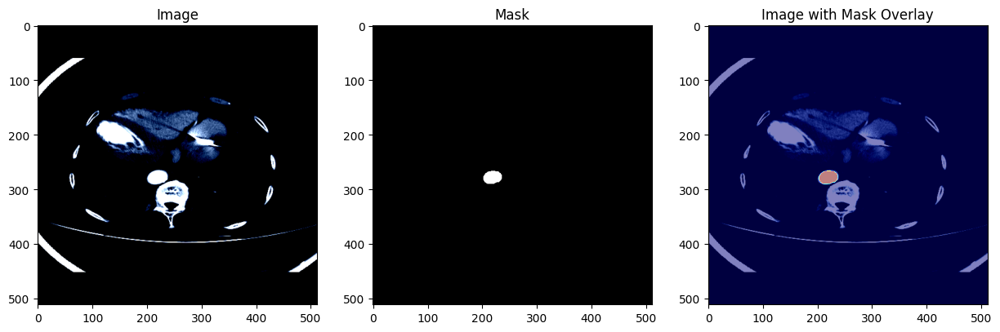

In [ ]:
sample_img = train_dataset[100]["pixel_values"].numpy()
sample_mask = train_dataset[100]["labels"].numpy()

print("Image Shape: ", sample_img.shape)
print("Mask Shape: ", sample_mask.shape)

# Convert tensors to numpy arrays for display
sample_img = sample_img.transpose(1, 2, 0)

# Switch x and y dimensions of the mask
# sample_mask = sample_mask.transpose(1, 0)

plt.figure(figsize=(15, 15))

plt.subplot(1, 3, 1)
plt.imshow(sample_img)
plt.title('Image')

plt.subplot(1, 3, 2)
plt.imshow(sample_mask, cmap='gray')
plt.title('Mask')

plt.subplot(1, 3, 3)
plt.imshow(sample_img)
plt.imshow(sample_mask, cmap='jet', alpha=0.5)
plt.title('Image with Mask Overlay')

plt.show()

In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=False)
valid_dataloader = DataLoader(valid_dataset, batch_size=4)
test_dataloader = DataLoader(test_data, batch_size=1)

In [ ]:
id2label = {0: 'background', 1: 'aortic', 2: 'arc', 3: 'asc', 4: 'dec', 5: 'body'}
label2id = {v: k for k, v in id2label.items()}

model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b5", ignore_mismatched_sizes=True,
                                                         num_labels=len(id2label), id2label=id2label, label2id=label2id,
                                                         reshape_last_stage=True)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b5 and are newly initialized: ['decode_head.classifier.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.batch_norm.weight', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.0.proj.weight', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.bias', 'decode_head.classifier.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_var', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_fuse.weight', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_c.0.proj.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
optimizer = AdamW(model.parameters(), lr=0.00006)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print("Model Initialized!")

Model Initialized!


/home/hn/.local/lib/python3.8/site-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


In [ ]:
# Initialize the CSV file
csv_file = '/home/hn/Downloads/Nancy_Downloads/New_CTA_Downloaded_dataset/Segmentation_Models/Techer_training_metrics.csv'

fieldnames = ['epoch', 'Teacher_train_loss', 'Teacher_val_loss', 'Teacher_train_accuracy', 'Teacher_val_accuracy',
              'Teacher_train_mean_iou', 'Teacher_val_mean_iou', 'Teacher_train_mean_dice', 'Teacher_val_mean_dice',
             ]

with open(csv_file, 'w', newline='') as csvfile:
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()

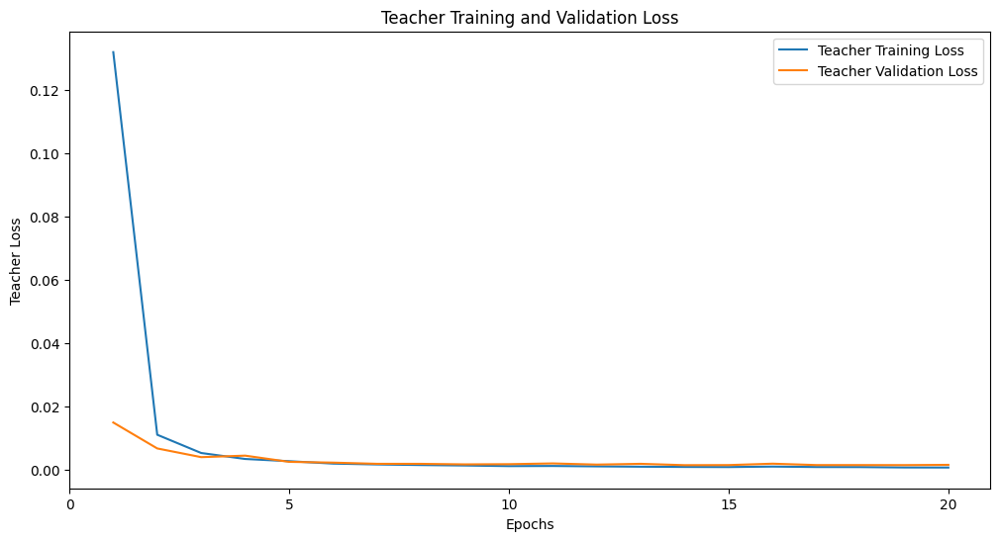

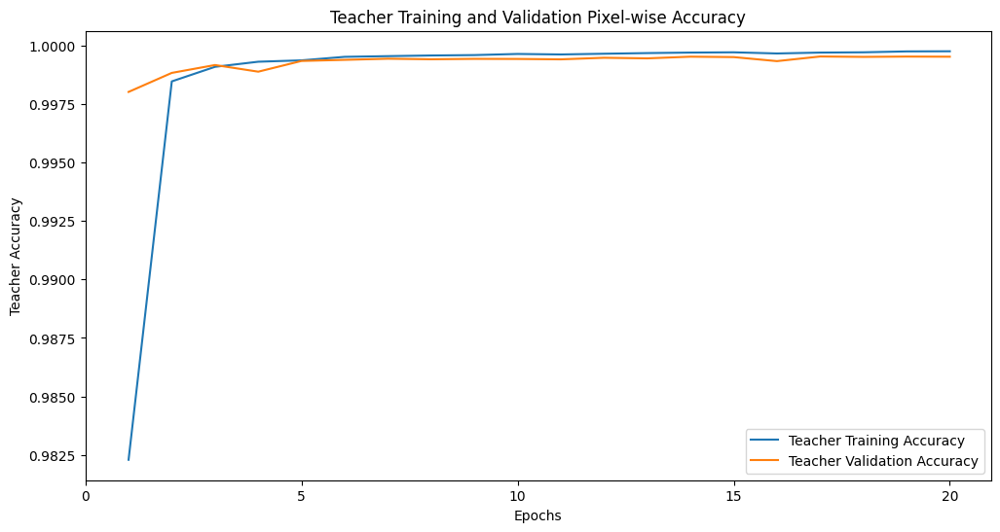

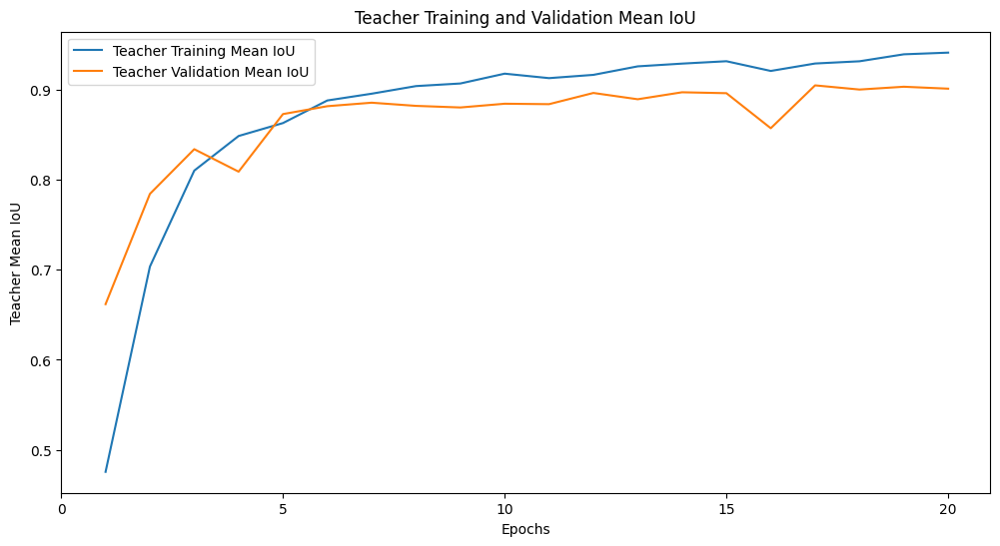

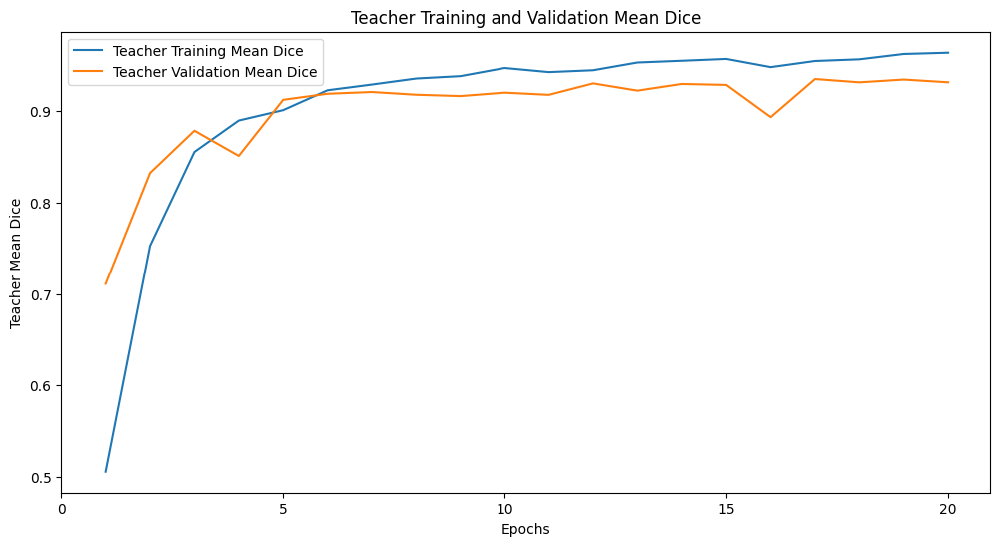

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
csv_file = '/home/hn/Downloads/Nancy_Downloads/New_CTA_Downloaded_dataset/Segmentation_Models/Techer_training_metrics.csv'
# Read the CSV file
df = pd.read_csv(csv_file)

epochs = df['epoch']

# Determine the x-tick positions based on your epochs
xticks = range(0, epochs.max() + 1, 5)  # Adjust the step to 5 or any desired interval

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(epochs, df['Teacher_train_loss'], label='Teacher Training Loss')
plt.plot(epochs, df['Teacher_val_loss'], label='Teacher Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Teacher Loss')
plt.title('Teacher Training and Validation Loss')
plt.xticks(xticks)
plt.legend()
plt.savefig('teacher_loss.png')  # Save the plot as an image
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(epochs, df['Teacher_train_accuracy'], label='Teacher Training Accuracy')
plt.plot(epochs, df['Teacher_val_accuracy'], label='Teacher Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Teacher Accuracy')
plt.title('Teacher Training and Validation Pixel-wise Accuracy')
plt.xticks(xticks)
plt.legend()
plt.savefig('teacher_accuracy.png')  # Save the plot as an image
plt.show()

# Plot mean IoU
plt.figure(figsize=(12, 6))
plt.plot(epochs, df['Teacher_train_mean_iou'], label='Teacher Training Mean IoU')
plt.plot(epochs, df['Teacher_val_mean_iou'], label='Teacher Validation Mean IoU')
plt.xlabel('Epochs')
plt.ylabel('Teacher Mean IoU')
plt.title('Teacher Training and Validation Mean IoU')
plt.xticks(xticks)
plt.legend()
plt.savefig('teacher_mean_iou.png')  # Save the plot as an image
plt.show()

# Plot mean Dice coefficient
plt.figure(figsize=(12, 6))
plt.plot(epochs, df['Teacher_train_mean_dice'], label='Teacher Training Mean Dice')
plt.plot(epochs, df['Teacher_val_mean_dice'], label='Teacher Validation Mean Dice')
plt.xlabel('Epochs')
plt.ylabel('Teacher Mean Dice')
plt.title('Teacher Training and Validation Mean Dice')
plt.xticks(xticks)
plt.legend()
plt.savefig('teacher_mean_dice.png')  # Save the plot as an image
plt.show()

In [ ]:
# Initialize the CSV file
csv_file_test = '/home/hn/Downloads/Nancy_Downloads/New_CTA_Downloaded_dataset/Segmentation_Models/Teacher_Testing_metrics.csv'

fieldnames_test = [
    'epoch','Teacher_test_accuracy', 'Teacher_test_loss', 'Teacher_test_mean_iou', 'Teacher_test_mean_dice'
]

# Initialize the CSV file
with open(csv_file_test, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=fieldnames_test)
    writer.writeheader()

In [ ]:
model.eval()
test_accuracies = []
test_losses = []
test_visualized_samples = []
test_ious = []
test_dices = []

with torch.no_grad():
    for idx, batch in enumerate(test_dataloader):
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        outputs = model(pixel_values=pixel_values, labels=labels)
        upsampled_logits = nn.functional.interpolate(outputs.logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
        predicted = upsampled_logits.argmax(dim=1)

        mask = (labels != 255)  # exclude background class
        pred_labels = predicted[mask].detach().cpu().numpy()
        true_labels = labels[mask].detach().cpu().numpy()
        accuracy = accuracy_score(pred_labels, true_labels)
        test_loss = outputs.loss.item()  # Convert to scalar
        test_iou = mean_iou(pred_labels, true_labels, num_classes=num_classes)
        test_dice = mean_dice(pred_labels, true_labels, num_classes=num_classes)

        test_accuracies.append(accuracy)
        test_losses.append(test_loss)
        test_ious.append(test_iou)
        test_dices.append(test_dice)

        test_visualized_samples.append((pixel_values[0], labels[0], predicted[0]))

    test_loss = sum(test_losses) / len(test_losses)
    test_accuracy = sum(test_accuracies) / len(test_accuracies)
    test_iou = sum(test_ious) / len(test_ious)
    test_dice = sum(test_dices) / len(test_dices)

    print(f"Test Pixel-wise accuracy: {test_accuracy}\n"
          f"Test Loss: {test_loss}\n"
          f"Test Mean IoU: {test_iou}\n"
          f"Test Mean Dice: {test_dice}\n")

    # Write metrics to CSV
    with open(csv_file_test, 'a', newline='') as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames_test)
        writer.writerow({
            'epoch': epoch,
            'Teacher_test_accuracy': test_accuracy,
            'Teacher_test_loss': test_loss,
            'Teacher_test_mean_iou': test_iou,
            'Teacher_test_mean_dice': test_dice,
        })

Test Pixel-wise accuracy: 0.999580605085506
Test Loss: 0.0012444477835615968
Test Mean IoU: 0.963463874295524
Test Mean Dice: 0.9755820867658319



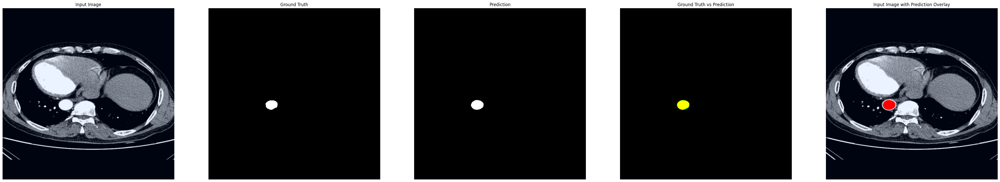

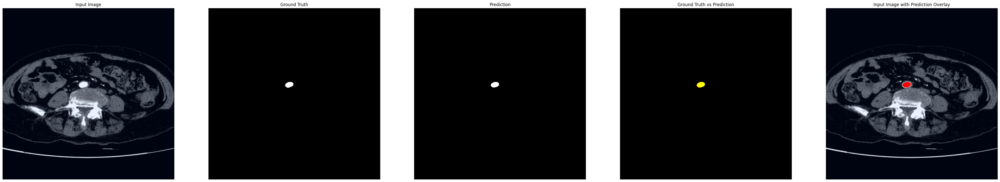

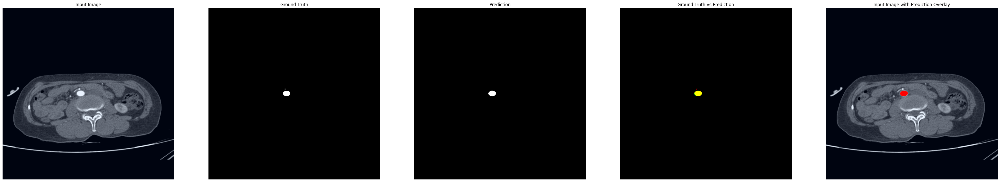

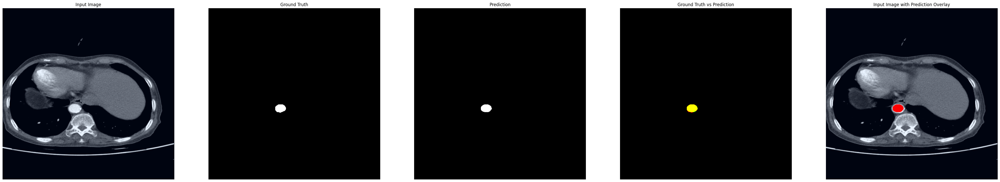

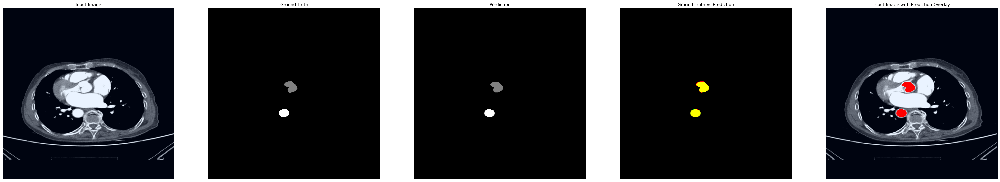

...

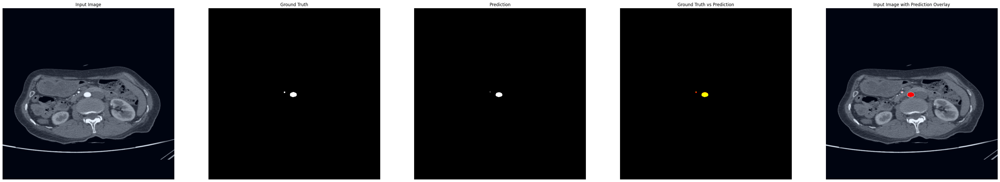

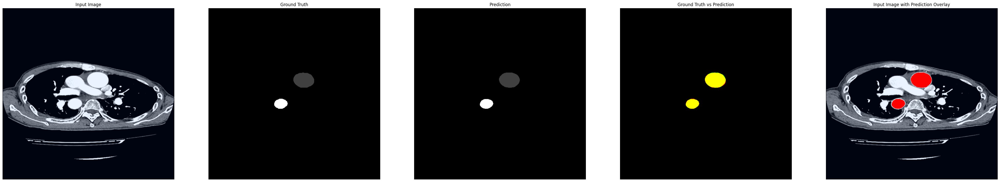

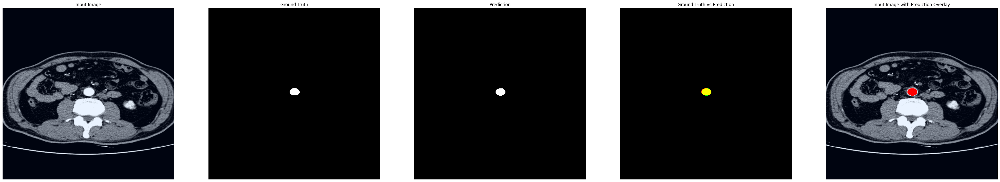

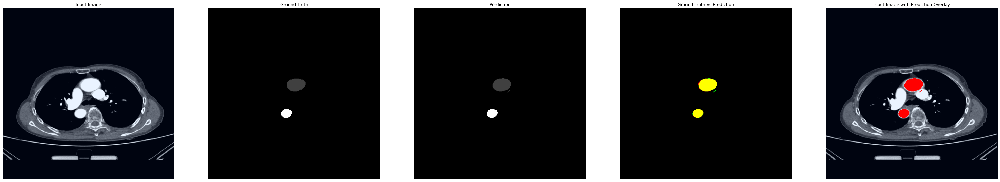

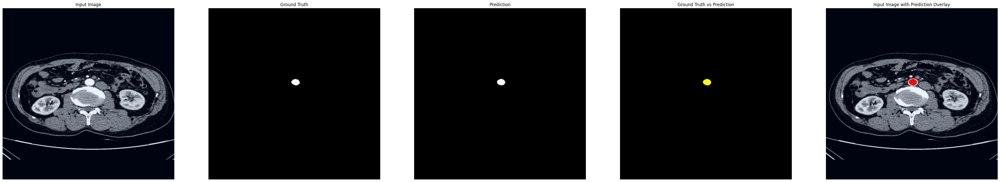

In [ ]:
# Visualize selected samples
num_samples_to_visualize = 40  # Number of samples you want to visualize
for i in range(num_samples_to_visualize):
    pixel_values, labels, predictions = test_visualized_samples[i]
    visualize_sample(pixel_values, labels, predictions)